# Digital Audio

During this chapter we will learn how raw audio is represented in a digital format.

## What is Audio?

Audio is a representation of sound, a combination of accoustic waves at different frequencies.

Analog audio is a continuous signal using levels of electric voltage.

Digital audio is an anlog signal that has been sampled and quantized.

## Human hearing frequency range

The hearing range for humans is between 20 Hz and 20KHz

<!--- http://www.cochlea.org/en/hear/human-auditory-range --->

<img src="res/human_audio_range.jpg" height="300">

Sounds below 20 Hz are called infrasounds and those above 20 KHz ultrasounds





## Human voice


<!--- https://en.wikipedia.org/wiki/Wideband_audio --->

The human voice uses range between 80 Hz and 14 kHz

voiceband or narrowband: range used in telephony from 300 Hz to 3.4 kHz 

wideband or HD audio: range used in modern telephony from 50 Hz to  7KHz


<!--- https://www.wydevoice.com/wyde-hd-audio.html --->
<img src="res/hdaudio.jpg" height="300">



## Why is the audible audio range so important in Digital Audio?


## Nyquist-Shannon sampling theorem

<!---  https://en.wikipedia.org/wiki/Nyquist%E2%80%93Shannon_sampling_theorem --->

This theorem proves that it possible to reconstruct the original-continous time function from its samples without looing any information if the signal is sampled at wice the highest frequency of that signal.

Our intuition would say that, by sampling the signal, loosing information is unavoidable. This theorem proves the opposite!

If the human higest audio frequency is 20KHz, we can convert audio to a digital format without loosing information by sampling it at 40KHz.


<img src="res/high_res_audio.png" height="300">

## PCM: Pulse Code Modulation

PCM is the name of the raw digital audio format.


<img src="res/pcm_encoder.jpg" height="300">

Doesn't it look similar to what we saw in our previous chapter? We created a Linear PCM encoder.

A PCM stream has 2 basic properties:
 * Sampling rate
 * Bit depth



## Digital audio representation

In [1]:
import sys
import wave
import matplotlib.pyplot as plt
import numpy as np
import IPython.display as ipd

In [2]:
# Open the WAV files
wav = wave.open("res/starwars.wav", "r")

# Read the sample rate
sample_rate = wav.getframerate()

# Get the number of channels
channels = wav.getnchannels()

# Get the audio bit depth
depth = wav.getsampwidth() * 8

# Read the signal into an array
signal = np.frombuffer(wav.readframes(-1), dtype=np.int16)

# Split right and left channels
left, right = signal[0::2], signal[1::2]

# Create a timeline in seconds
time = np.linspace(0, len(signal)/channels/sample_rate, num=int(len(signal)/channels))

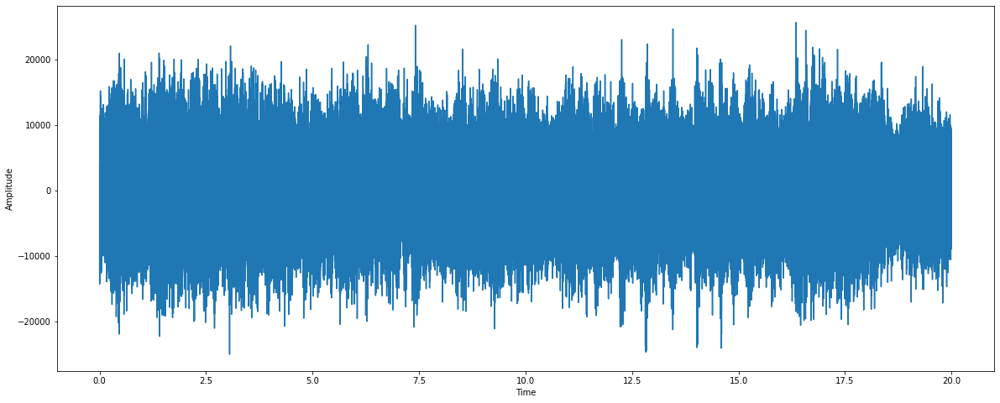

In [3]:
# Plot the left channel
fig, ax = plt.subplots (figsize=(20, 8))
ax.plot(time, left)
ax.set_xlabel('Time')
ax.set_ylabel('Amplitude')
plt.show()

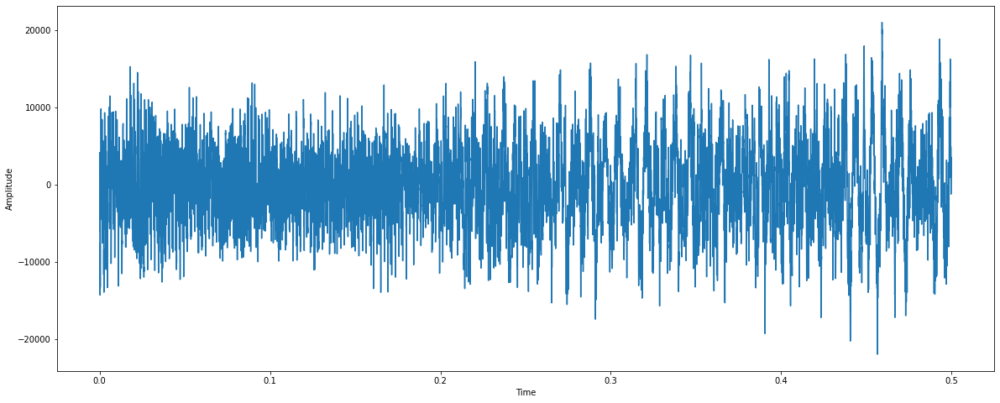

In [4]:
# Plot the first 0.5s of the left channel
fig, ax = plt.subplots (figsize=(20, 8))
samples = int(sample_rate / 2)
ax.plot(time[0:samples], left[0:samples])
ax.set_xlabel('Time')
ax.set_ylabel('Amplitude')
plt.show()

## Sampling rate

The sampling rate of audio signal is the frequency at which we sample the analog signal.

In [ ]:
# Render the original signal
print ("Sample Rate {} Hz".format(int(sample_rate)))
ipd.display(ipd.Audio(data=left, rate=sample_rate))

In [ ]:
# Downsample the audio signal to 22050 Hz
print ("Sample Rate {} Hz".format(int(sample_rate/2)))
ipd.display(ipd.Audio(data=left[::2], rate=sample_rate/2))

In [ ]:
# Downsample the audio signal to 11025 Hz
print ("Sample Rate {} Hz".format(int(sample_rate/4)))
ipd.display(ipd.Audio(data=left[::4], rate=sample_rate/4))

In [5]:
# Downsample the audio signal to 5512 Hz
print ("Sample Rate {} Hz".format(int(sample_rate/8)))
ipd.display(ipd.Audio(data=left[::8], rate=sample_rate/8))

Sample Rate 44100 Hz


Sample Rate 22050 Hz


Sample Rate 11025 Hz


Sample Rate 5512 Hz


## Audio bit depth

Audio bit depth is the number of bits used for quantization


In [ ]:
# Returns the step of each level for the quantization bits
def get_quantizing_step(quantizing_bits):
    quantizing_levels = 2 ** quantizing_bits
    # Linear PCM quantization
    return 2 ** 16 / (quantizing_levels - 1)

# Quantize the signal, rounding the values to analog signal to the quantized ones
def quantize_signal(x, quantizing_bits):
    quantizing_levels = 2 ** quantizing_bits
    quantizing_step = get_quantizing_step(quantizing_bits)
    if quantizing_levels % 2 == 0:
        return quantizing_step * (np.around(x / quantizing_step + 0.5) - 0.5)
    else:
        return quantizing_step * np.around(x / quantizing_step)  

In [6]:
bits = depth
# Render the orignal digital audio signal
print ("Bit depth {}".format(int(bits)))
ipd.display(ipd.Audio(data=left, rate=sample_rate))
bits = bits / 2

# Change the audio bit depth to 8, 4, and 2 quantizing the signal

for i in range(3):
    print ("Bit depth {}".format(int(bits)))
    ipd.display(ipd.Audio(data=quantize_signal(left, bits), rate=sample_rate))
    bits = bits / 2

Bit depth 16


Bit depth 8


Bit depth 4


Bit depth 2


## Channels

Audio channels are separete streams of audio

 * Mono: a single audio channel
 * Stereo: left and right channels
 * Sourround: Multiple audio channels. 5.1 -> 5 channels + 1 Bass chanel
 * 3D audio:  Multiple audio channels in a 3D space

<img src="res/3daudio.png" height="200">



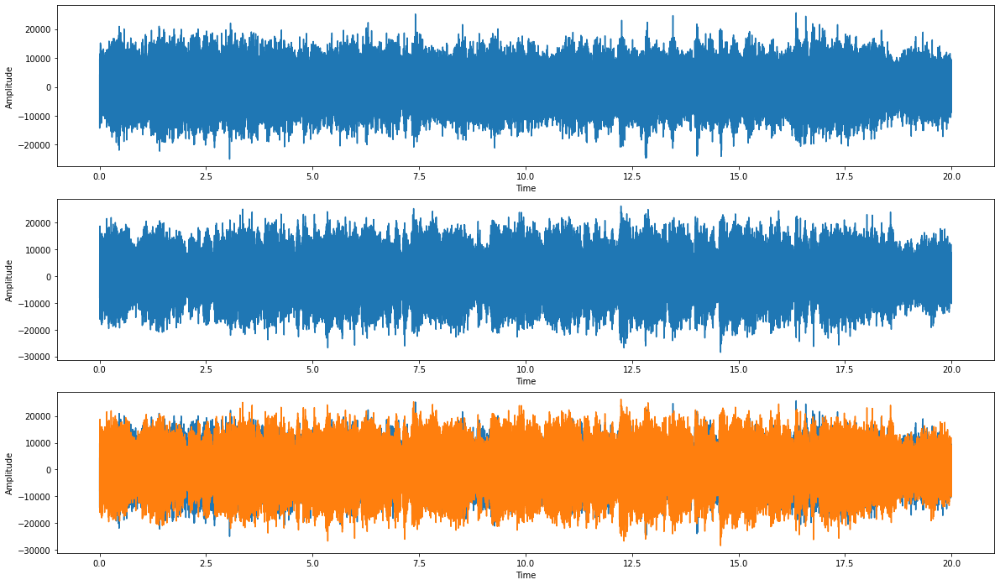

In [7]:
# Plot the left channel
fig, (ax1, ax2, ax3) = plt.subplots (3, 1, figsize=(20, 12))
ax1.plot(time, left)
ax1.set_xlabel('Time')
ax1.set_ylabel('Amplitude')

# Plot the right channel
ax2.plot(time, right)
ax2.set_xlabel('Time')
ax2.set_ylabel('Amplitude')

# Plot the right channel
ax3.plot(time, left)
ax3.plot(time, right)
ax3.set_xlabel('Time')
ax3.set_ylabel('Amplitude')

plt.show()

## Frequency domain repesentation

A signal can be resented in the frequency domain.

<!--- https://en.wikipedia.org/wiki/Fourier_transform --->

Signals can be converted from the time domain to the frequency domain with the Fourrier Transform

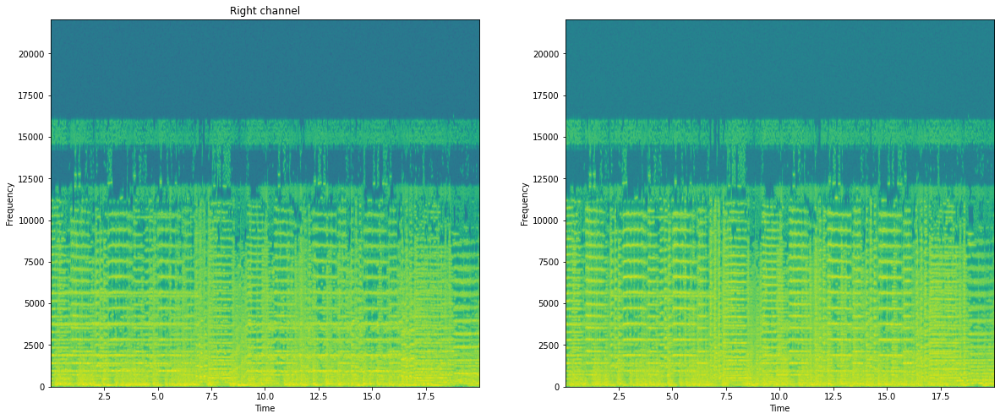

In [9]:
fig, (ax1, ax2) = plt.subplots (1, 2, figsize=(20, 8))
ax1.specgram(left, NFFT=1024, Fs=sample_rate, noverlap=900)
ax1.set_xlabel('Time')
ax1.set_ylabel('Frequency')
ax1.set_title("Left channel")
ax2.specgram(right, NFFT=1024, Fs=sample_rate, noverlap=900)
ax2.set_xlabel('Time')
ax2.set_ylabel('Frequency')
ax1.set_title("Right channel")
plt.show()

## Bitrate

The bitrate of a raw audio signal is calculated from the sampling frequency, the audio bit depth and the number of channels

<font size="4"> Bitrate = Sample rate * Bit depth * Channels (bps) </font>

For example, for a PCM encoded stream with 44100kHz, 16-bit and 2 channels:

<font size="4">  Bitrate = 441000 * 16 * 2 (bps) </font>

<font size="4">  Bitrate = 1411200 (bps) </font>